In [1]:
#import all the required dependancies
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display
import ipywidgets as widgets
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

# Camera Calibration

In [2]:
#the number of inner square corners in the x and y axes
nx = 9
ny = 6
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P4/CarND-Advanced-Lane-Lines-master/camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

#close any window opened for preview
cv2.destroyAllWindows()

In [3]:
#perform the calibration after getting the obj and img points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [4]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    #if ret == True:
    # If we found corners, draw them! (just for fun)
    cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
    # Choose offset from image corners to plot detected corners
    # This should be chosen to present the result at the proper aspect ratio
    # My choice of 100 pixels is not exact, but close enough for our purpose here
    offset = 100 # offset for dst points
    # Grab the image shape
    img_size = (gray.shape[1], gray.shape[0])
    # For source points I'm grabbing the outer four detected corners
    src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
    # For destination points, I'm arbitrarily choosing some points to be
    # a nice fit for displaying our warped result 
    # again, not exact, but close enough for our purposes
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                 [img_size[0]-offset, img_size[1]-offset], 
                                 [offset, img_size[1]-offset]])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M, img_size)
    # Return the resulting image and matrix
    return warped, M

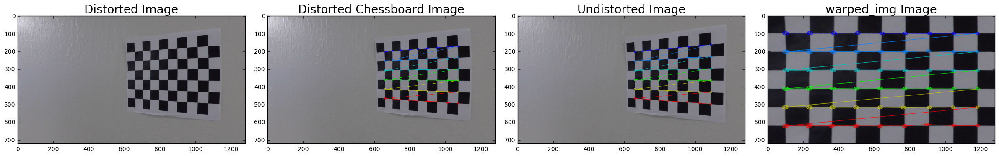

In [5]:
#output an undistorted and transformed image
img = mpimg.imread(images[5])
# Convert undistorted image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# Search for corners in the grayscaled image
ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
# If we found corners, draw them! (just for fun)
dist_drawn = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
undist = cv2.undistort(img, mtx, dist, None, mtx)
# warped (transformed image)
warped_img, M = corners_unwarp(mpimg.imread(images[5]), nx, ny, mtx, dist )
distorted = mpimg.imread(images[5])

#plot outputs
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(distorted)
ax1.set_title('Distorted Image', fontsize=20)
ax2.imshow(dist_drawn)
ax2.set_title('Distorted Chessboard Image', fontsize=20)
ax3.imshow(undist)
ax3.set_title('Undistorted Image', fontsize=20)
ax4.imshow(warped_img)
ax4.set_title('warped_img Image', fontsize=20)

In [6]:
#undistort image function
def undistort_img(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [7]:
#load an image
img = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/CarND-Advanced-Lane-Lines-master/test_images/test5.jpg')

# Lane Finding

In [8]:
#pipeline for the full gradient combinations
def grad_pipeline(img):
    #fixed values
    dir_k = 17
    dir_thresh_min = 0.4
    dir_thresh_max = 1.3
    mag_thresh_min = 45
    mag_thresh_max = 130
    thresh_min_x = 30
    thresh_max_x = 130
    thresh_min_y = 30
    thresh_max_y = 130
    
    #grayscale of the image 
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    #absolutes
    abs_sobel_x = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=dir_k))
    abs_sobel_y = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=dir_k))
    abs_sobel_xy = np.sqrt((np.square(abs_sobel_x))+(np.square(abs_sobel_y)))
    
    #obtain x and y thresholds
    scaled_sobelx = np.uint8(255*abs_sobel_x/np.max(abs_sobel_x))
    scaled_sobely = np.uint8(255*abs_sobel_y/np.max(abs_sobel_y))
    binary_outputx = np.zeros_like(scaled_sobelx)
    binary_outputx[(scaled_sobelx >= thresh_min_x) & (scaled_sobelx <= thresh_max_x)] = 1
    binary_outputy = np.zeros_like(scaled_sobely)
    binary_outputy[(scaled_sobely >= thresh_min_y) & (scaled_sobely <= thresh_max_y)] = 1
    
    #obtain the magnitude threshold
    scaled_sobel = np.uint8(255*abs_sobel_xy/np.max(abs_sobel_xy))
    mag_binary = np.zeros_like(scaled_sobel)
    mag_binary[(scaled_sobel >= mag_thresh_min) & (scaled_sobel <= mag_thresh_max)] = 1
    
    #obtain the directional threshold
    gradient_direction = np.arctan2(abs_sobel_y, abs_sobel_x)
    dir_binary = np.zeros_like(gradient_direction)
    dir_binary[(gradient_direction >= dir_thresh_min) & (gradient_direction <= dir_thresh_max)] = 1
    
    #combine the grad_thresholds
    combined = np.zeros_like(dir_binary)
    combined[((binary_outputx == 1) & (binary_outputy == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    return combined

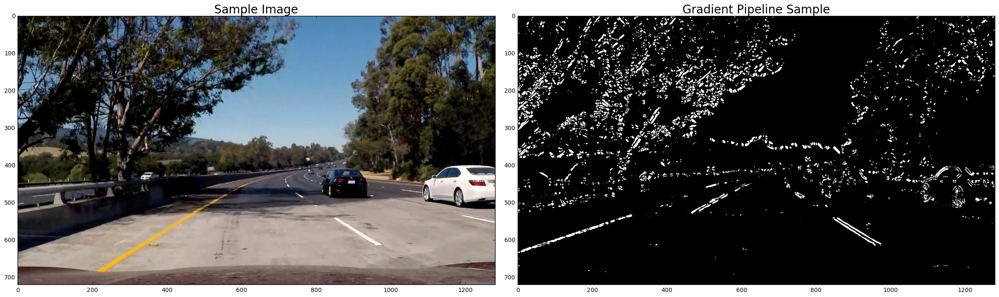

In [9]:
#plot outputs
f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(grad_pipeline(img), cmap = 'gray')
ax2.set_title('Gradient Pipeline Sample', fontsize=20)

In [10]:
#colour channel thresholding pipeline
def col_pipeline(img):
    #fixed values
    R_thresh_min = 200
    R_thresh_max = 255
    S_thresh_min = 170
    S_thresh_max = 255
    L_thresh_min = 20
    L_thresh_max = 100
    
    #get the R channel threshold
    R = img[:,:,0]
    binary_R = np.zeros_like(R)
    binary_R[(R > R_thresh_min) & (R <= R_thresh_max)] = 1
    
    #get the S and L channel thresholds
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    L_sobelx = cv2.Sobel(L, cv2.CV_64F, 1, 0) # Take the derivative in x
    L_abs_sobelx = np.absolute(L_sobelx) # Absolute x derivative to accentuate lines away from horizontal
    L_scaled_sobel = np.uint8(255*L_abs_sobelx/np.max(L_abs_sobelx))
    
    # Threshold x gradient
    L_s_binary = np.zeros_like(L_scaled_sobel)
    L_s_binary[(L_scaled_sobel >= L_thresh_min) & (L_scaled_sobel <= L_thresh_max)] = 1
    
    # Threshold color channel
    S_binary = np.zeros_like(S)
    S_binary[(S >= S_thresh_min) & (S <= S_thresh_max)] = 1

    #combine the thresholds
    combined = np.zeros_like(binary_R)
    combined[((binary_R == 1) & (L_s_binary == 1)) | ((S_binary == 1))] = 1
    color_binary = combined
    
    return color_binary

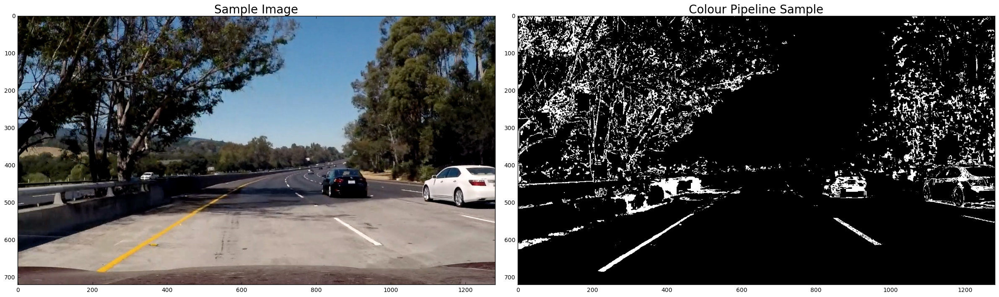

In [11]:
#plot outputs
f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(col_pipeline(img), cmap = 'gray')
ax2.set_title('Colour Pipeline Sample', fontsize=20)

In [12]:
# a function that calls and combines the thresholding pipelines
def get_lanes(img):
    #combine the grad and color thresholds
    combined = np.zeros_like(img[:,:,2])
    combined[((col_pipeline(img) == 1) | (grad_pipeline(img) == 1))] = 1
    
    return combined

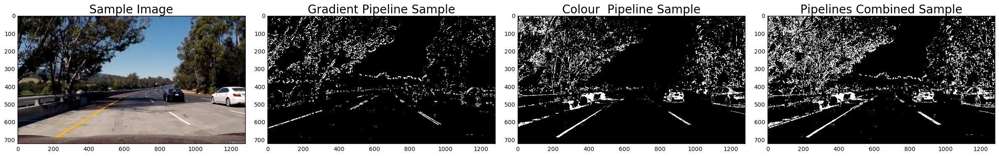

In [13]:
#plot outputs
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(grad_pipeline(img), cmap = 'gray')
ax2.set_title('Gradient Pipeline Sample', fontsize=20)
ax3.imshow(col_pipeline(img), cmap = 'gray')
ax3.set_title('Colour  Pipeline Sample', fontsize=20)
ax4.imshow(get_lanes(img), cmap = 'gray')
ax4.set_title('Pipelines Combined Sample', fontsize=20)

In [14]:
#function to transform the perpective of the image
def persp_trans(img):
    #fixed values based on experimentation
    src1x=0
    src2x=1280
    src3x=754
    src4x=526
    src1y=720
    src2y=720
    src3y=470
    src4y=470
    dst1x=0
    dst2x=1280
    dst3x=1280
    dst4x=0
    dst1y=720
    dst2y=720
    dst3y=0
    dst4y=0
    #get the input image size (since this may vary between runs)
    img_size = (img.shape[1], img.shape[0])

    #obtain and set the source points based on the given ratios
    src = np.float32([[img.shape[1]*(src1x/1280),img.shape[0]*(src1y/720)],
                      [img.shape[1]*(src2x/1280),img.shape[0]*(src2y/720)],
                      [img.shape[1]*(src3x/1280),img.shape[0]*(src3y/720)],
                      [img.shape[1]*(src4x/1280),img.shape[0]*(src4y/720)]])
    
    #obtain and set the destination points based on the given ratios
    dst = np.float32([[img.shape[1]*(dst1x/1280),img.shape[0]*(dst1y/720)],
                      [img.shape[1]*(dst2x/1280),img.shape[0]*(dst2y/720)],
                      [img.shape[1]*(dst3x/1280),img.shape[0]*(dst3y/720)],
                      [img.shape[1]*(dst4x/1280),img.shape[0]*(dst4y/720)]])
    
    #obtain the transormation matrix from source to destination
    M = cv2.getPerspectiveTransform(src, dst)
    #obtain the inverse of the matrix to undo the transformation after curvature is obtained
    Minv = cv2.getPerspectiveTransform(dst, src)
    #warp the input image to the destination coordinates
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

In [73]:
#load an image
img = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/CarND-Advanced-Lane-Lines-master/test_images/straight_lines1.jpg')

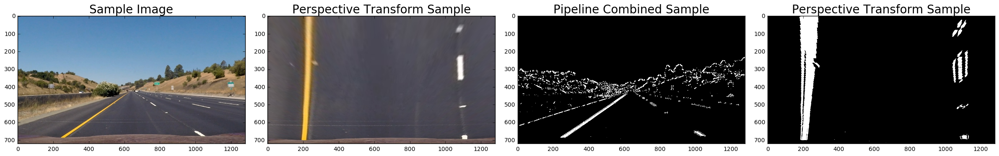

In [16]:
#plot outputs
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(persp_trans(img)[0])
ax2.set_title('Perspective Transform Sample', fontsize=20)
ax3.imshow(get_lanes(img), cmap = 'gray')
ax3.set_title('Pipeline Combined Sample', fontsize=20)
ax4.imshow(persp_trans(get_lanes(img))[0], cmap = 'gray')
ax4.set_title('Perspective Transform Sample', fontsize=20)

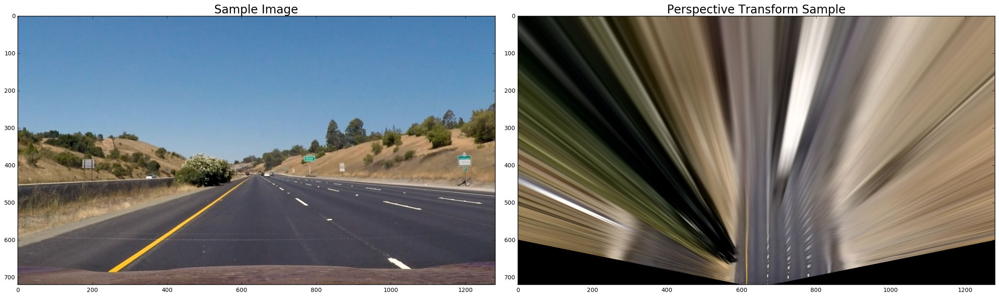

In [17]:
#function to transform the perpective of the image
def persp_trans2(src1x=0,
    src2x=1280,
    src3x=754,
    src4x=526,
    src1y=720,
    src2y=720,
    src3y=400,
    src4y=400,
    dst1x=0,
    dst2x=1280,
    dst3x=1280,
    dst4x=0,
    dst1y=720,
    dst2y=720,
    dst3y=0,
    dst4y=0):
    #fixed values based on experimentation
    
    #get the input image size (since this may vary between runs)
    img_size = (img.shape[1], img.shape[0])

    #obtain and set the source points based on the given ratios
    src = np.float32([[img.shape[1]*(src1x/1280),img.shape[0]*(src1y/720)],
                      [img.shape[1]*(src2x/1280),img.shape[0]*(src2y/720)],
                      [img.shape[1]*(src3x/1280),img.shape[0]*(src3y/720)],
                      [img.shape[1]*(src4x/1280),img.shape[0]*(src4y/720)]])
    
    #obtain and set the destination points based on the given ratios
    dst = np.float32([[img.shape[1]*(dst1x/1280),img.shape[0]*(dst1y/720)],
                      [img.shape[1]*(dst2x/1280),img.shape[0]*(dst2y/720)],
                      [img.shape[1]*(dst3x/1280),img.shape[0]*(dst3y/720)],
                      [img.shape[1]*(dst4x/1280),img.shape[0]*(dst4y/720)]])
    
    #obtain the transormation matrix from source to destination
    M = cv2.getPerspectiveTransform(src, dst)
    #obtain the inverse of the matrix to undo the transformation after curvature is obtained
    Minv = cv2.getPerspectiveTransform(dst, src)
    #warp the input image to the destination coordinates
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    #plot outputs

    

    f, (ax1, ax2) = plt.subplots(1,2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Sample Image', fontsize=20)
    ax2.imshow(warped)
    ax2.set_title('Perspective Transform Sample', fontsize=20)
#     return warped, M, Minv

interact(persp_trans2,
    src1x=(0,1280,1),
    src2x=(0,1280),
    src3x=(0,1280),
    src4x=(0,1280),
    src1y=(0,1280),
    src2y=(0,1280),
    src3y=(0,1280),
    src4y=(0,1280),
    dst1x=(0,1280),
    dst2x=(0,1280),
    dst3x=(0,1280),
    dst4x=(0,1280),
    dst1y=(0,1280),
    dst2y=(0,1280),
    dst3y=(0,1280),
    dst4y=(0,1280,1))


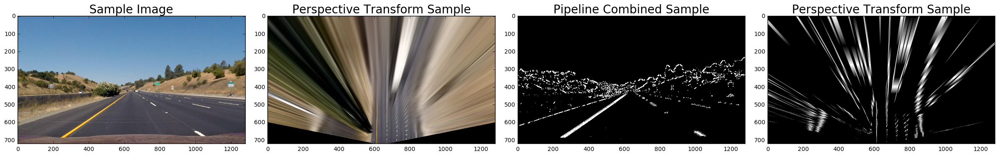

In [74]:
#function to transform the perpective of the image
def persp_trans3(img):
    #fixed values based on experimentation
    src1x=0
    src2x=1280
    src3x=750
    src4x=525
    src1y=720
    src2y=720
    src3y=425
    src4y=425
    dst1x=600
    dst2x=680
    dst3x=1280
    dst4x=0
    dst1y=720
    dst2y=720
    dst3y=0
    dst4y=0
    #get the input image size (since this may vary between runs)
    img_size = (img.shape[1], img.shape[0])

    #obtain and set the source points based on the given ratios
    src = np.float32([[img.shape[1]*(src1x/1280),img.shape[0]*(src1y/720)],
                      [img.shape[1]*(src2x/1280),img.shape[0]*(src2y/720)],
                      [img.shape[1]*(src3x/1280),img.shape[0]*(src3y/720)],
                      [img.shape[1]*(src4x/1280),img.shape[0]*(src4y/720)]])
    
    #obtain and set the destination points based on the given ratios
    dst = np.float32([[img.shape[1]*(dst1x/1280),img.shape[0]*(dst1y/720)],
                      [img.shape[1]*(dst2x/1280),img.shape[0]*(dst2y/720)],
                      [img.shape[1]*(dst3x/1280),img.shape[0]*(dst3y/720)],
                      [img.shape[1]*(dst4x/1280),img.shape[0]*(dst4y/720)]])
    
    #obtain the transormation matrix from source to destination
    M = cv2.getPerspectiveTransform(src, dst)
    #obtain the inverse of the matrix to undo the transformation after curvature is obtained
    Minv = cv2.getPerspectiveTransform(dst, src)
    #warp the input image to the destination coordinates
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv
#plot outputs
f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(persp_trans3(img)[0])
ax2.set_title('Perspective Transform Sample', fontsize=20)
ax3.imshow(get_lanes(img), cmap = 'gray')
ax3.set_title('Pipeline Combined Sample', fontsize=20)
ax4.imshow(persp_trans3(cv2.Canny(img,240,250))[0], cmap = 'gray')
ax4.set_title('Perspective Transform Sample', fontsize=20)

#480>800

(480, 1280)


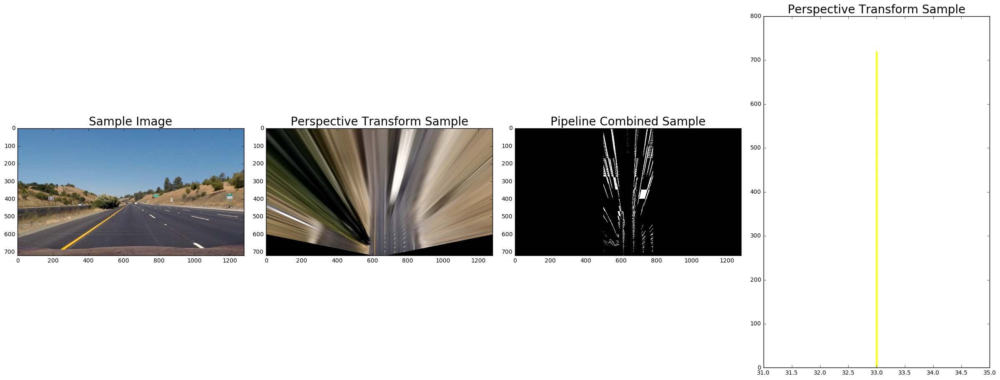

In [188]:
test_img = persp_trans3(cv2.Canny(img,245,250))[0]
print(test_img[:480,:].shape)
test_img[:,:500] = 0
test_img[:,780:] = 0

test_img = cv2.equalizeHist(test_img)
test_img = cv2.Sobel(test_img,cv2.CV_64F,0,1,ksize=1)

test_img[test_img <= 1] = 0
test_img[test_img > 1] = 1
# test_img = cv2.Sobel(test_img,cv2.CV_64F,0,1,ksize=27)

# res = np.hstack((test_img,equ)) #stacking images side-by-side

histogram = np.sum(test_img[int(test_img.shape[0]/2):,:], axis=0)
leftx_base = np.argmax(histogram[640:])
ploty = [x for x in range(720)]
leftx_base = [leftx_base for i in range(720)]
# plt.plot()

f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Sample Image', fontsize=20)
ax2.imshow(persp_trans3(img)[0])
ax2.set_title('Perspective Transform Sample', fontsize=20)
ax3.imshow(test_img, cmap = 'gray')
ax3.set_title('Pipeline Combined Sample', fontsize=20)
ax4.plot(leftx_base, ploty, 'x', color='yellow', markersize=mark_size)
ax4.set_title('Perspective Transform Sample', fontsize=20)

In [81]:
#Global value placeholders
r_pre = []
l_pre = []
l_inds_pre = []
r_inds_pre = []
counter_chk = 0
#function to detect the lane lines, draw them, obtain the fitted lines points
_out_img = []
_left_fitx = []
_right_fitx = []
_ploty = []
_left_fit = []
_right_fit = []
_warped = []
_mid_lanes = []
_righty = []
_rightx = []
_lefty = []
_leftx = []
    

def lanes_and_curv(warped, draw_squares=False):
    global r_pre
    global l_pre
    global counter_chk
    global l_inds_pre
    global r_inds_pre
#     global _out_img = []
#     global _left_fitx = []
#     global _right_fitx = []
#     global _ploty = []
#     global _left_fit = []
#     global _right_fit = []
#     global _warped = []
#     global _mid_lanes = []
    global _righty
    global _rightx
    global _lefty
    global _leftx
    
    
    
    
    
    counter_reset = 24
    # Take a histogram of the bottom half of the image
    binary_warped = warped
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((warped, warped, warped))*255
    # this mid point will also help identify the car's position within the lanes by comparing the midpoint with
    # the image's midpoint
    midpoint = np.int(histogram.shape[0]/2)
    # Find the peak of the left and right halves of the histogram
    # These will be the starting points for the left and right lines
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    #this is to check that the lanes are at least a certain amount apart by whichever lane is more likely correct
    #based on general lane to image proportions
    if (rightx_base - leftx_base) < midpoint:
        if leftx_base > ((histogram.shape[0])/3):
            leftx_base = int(rightx_base - midpoint*1.35)
        else:     
            rightx_base = int(leftx_base + midpoint*1.35)
    # middle of the lane at the base line
    mid_lanes = (rightx_base + leftx_base)/2
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    maxpix = 300
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        if draw_squares == True:
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    
    # Fit a second order polynomial to each
    if lefty.size and leftx.size and righty.size and rightx.size:
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        _lefty = lefty
        _leftx = leftx
        _righty = righty
        _rightx = rightx
    else:
        lefty = _lefty
        leftx = _leftx
        righty = _righty
        rightx = _rightx
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        
    #smooth the results
    if np.array_equal(l_pre,[]):
        l_pre = left_fit
        r_pre = right_fit
    else:
        l_holder = []
        r_holder = []
        for i in range(len(left_fit)):
            left_fiti = left_fit[i]*0.9+l_pre[i]*0.1
            right_fiti = right_fit[i]*0.9+r_pre[i]*0.1
            l_holder.append(left_fiti)
            r_holder.append(right_fiti)
            
        left_fit = l_holder
        right_fit = r_holder
        l_pre = left_fit
        r_pre = right_fit
        
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [99, 42, 42]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [219, 104, 255]
    
    return out_img, left_fitx, right_fitx, ploty, left_fit, right_fit, warped, mid_lanes


0


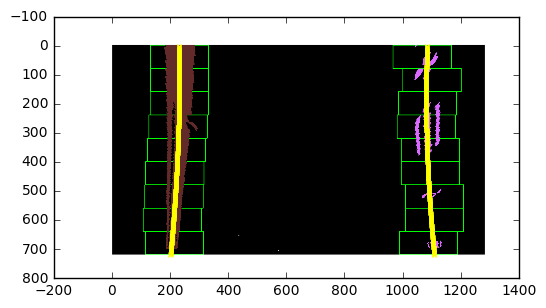

In [82]:
out_img, left_fitx, right_fitx, ploty, left_fit, right_fit, warped, mid_lanes = lanes_and_curv(persp_trans(get_lanes(img))[0], True)
plt.imshow(out_img)
mark_size = 3

curve_avg_lr = np.subtract(right_fitx, left_fitx)
x_diff = -curve_avg_lr[0]+right_fitx[0]
for x in range(len(curve_avg_lr)):
    curve_avg_lr[x] = curve_avg_lr[x]+x_diff



start_diff = int(np.absolute(curve_avg_lr[0]-right_fitx[0]))
print(int(np.absolute(start_diff)))
left_fitx_diff = np.add(left_fitx, start_diff)
plt.plot(left_fitx, ploty, 'x', color='yellow', markersize=mark_size)
plt.plot(right_fitx, ploty, 'x', color='yellow', markersize=mark_size)
# plt.plot(curve_avg_lr, ploty, 'x', color='red', markersize=mark_size)
# plt.plot(left_fitx_diff, ploty, 'x', color='red', markersize=mark_size)

In [83]:
def real_curv(out_img, left_fitx, right_fitx, ploty, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
#     print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    return left_curverad, right_curverad

# real_curv(out_img, left_fitx, right_fitx, ploty, left_fit, right_fit)

In [84]:
def draw_curv(img, warped, left_fitx, right_fitx, ploty, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts[:,:,:]]), (0, 203, 255))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 0.8, newwarp, 0.8, 0)
    
    return result
# result = draw_curv(img, warped, left_fitx, right_fitx, ploty, Minv)

In [85]:
#layer together two input images
def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    return cv2.addWeighted(initial_img, α, img, β, λ)

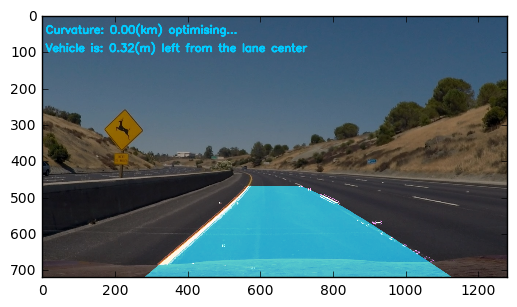

In [86]:
#placeholder values
LC = 90
counter = 0
runs = []
print_curv = 0
#function used to process an image
def process_img(img):
    global LC
    global runs
    global counter
    global print_curv
    
    #the precious curvature value
    last_curv = LC
    #obtain the M matrix, Minverse matrix and warped version of the input image
    warped, M, Minv = persp_trans(get_lanes(img))
    #obtain the arrays to fit and plot the lane lines ove rthe input image
    out_img, left_fitx, right_fitx, ploty, left_fit, right_fit, warped, midpoint = lanes_and_curv(warped)
    #get the image shape
    img_x = img.shape[1]
    img_y = img.shape[0]
    #compute the ratio between the image used in setup and input image, then define the conversion between pixels and meters
    pixel_diff = int(midpoint - img_x/2)
    pixel_to_m = 3.7/(((1100-220)/1280)*img_x)
    #used the pixel_to_m to find the cars position within the lane itself
    m_lane_mid = pixel_diff * pixel_to_m
    #obtain the left and right lane curvatures of the input image
    left_curverad, right_curverad = real_curv(out_img, left_fitx, right_fitx, ploty, left_fit, right_fit)
    #draw the result on the input image
    final_img = draw_curv(img, warped, left_fitx, right_fitx, ploty, Minv)
    #return the image back to it's normal perspective
    newwarp = cv2.warpPerspective(out_img, Minv, (img.shape[1], img.shape[0])) 
    #layer the result of the input image
    weighted = weighted_img(newwarp, final_img)
    #define the font to display the numerical values
    font = cv2.FONT_HERSHEY_SIMPLEX
    #get the average of the right and left lane curvatures and append to a running array
    avg_curv = ((left_curverad+right_curverad)/2000)
    runs.append(avg_curv)
    
    #only start to display the curvature after 48 frames to ensure its not too jumpy
    if len(runs) > 48 or (print_curv) > 0:
        counter = 1
        print_curv = np.mean(runs[-24:-1])
        img_text = cv2.putText(weighted,("Curvature: " + str("{0:.2f}".format(print_curv)) + "(km) smoothed"),(10,50), font, 1,(0, 203, 255),4,cv2.LINE_AA)
    else:
        img_text = cv2.putText(weighted,("Curvature: " + str("{0:.2f}".format(print_curv)) + "(km) optimising..."),(10,50), font, 1,(0, 203, 255),4,cv2.LINE_AA)
    
    #check whether the offset is to the left or to the right of the lane center and print accordingly
    if m_lane_mid > 0:
        img_text = cv2.putText(weighted,("Vehicle is: " + str("{0:.2f}".format(m_lane_mid)) + "(m) left from the lane center"),(10,100), font, 1,(0, 203, 255),4,cv2.LINE_AA)
    else:
        img_text = cv2.putText(weighted,("Vehicle is: " + str("{0:.2f}".format(-m_lane_mid)) + "(m) right from the lane center"),(10,100), font, 1,(0, 203, 255),4,cv2.LINE_AA)
    
    return img_text

plt.imshow(process_img(mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P4/CarND-Advanced-Lane-Lines-master/test_images/test2.jpg')))
# plt.savefig("/home/da7th/Desktop/download.png", bbox_inches='tight', pad_inches=0)

## Video for lane finding only

In [24]:
heat_maps = []
white_output = '/home/da7th/Desktop/Udacity/sdc/CarND-P5/black_lane.mp4'
clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4").subclip(35,37)
# clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4")
# reset_lines()
white_clip = clip1.fl_image(process_img) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video /home/da7th/Desktop/Udacity/sdc/CarND-P5/black_lane.mp4
[MoviePy] Writing video /home/da7th/Desktop/Udacity/sdc/CarND-P5/black_lane.mp4


  2%|▏         | 20/1261 [00:05<05:56,  3.48it/s]

KeyboardInterrupt: 

# Vehicle Detection

In [2]:
#imports
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
import glob
from sklearn.svm import LinearSVC
from sklearn.cross_validation import train_test_split
from sklearn.utils import shuffle
from skimage.feature import hog
import imghdr
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

%matplotlib inline

/home/da7th/anaconda3/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


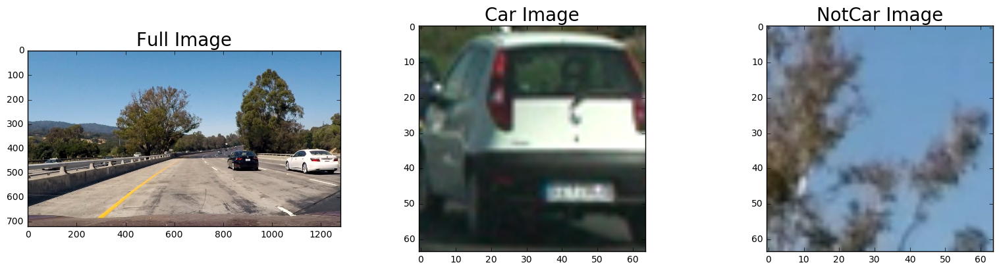

In [3]:
img_full = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P5/test_images/test1.jpg') 
img_car = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/GTI_Right/image0301.png') 
img_notcar = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P5/non-vehicles/Extras/extra16.png') 
f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16, 4))
f.tight_layout()
ax1.imshow(img_full)
ax1.set_title('Full Image', fontsize=20)
ax2.imshow(img_car)
ax2.set_title('Car Image', fontsize=20)
ax3.imshow(img_notcar)
ax3.set_title('NotCar Image', fontsize=20)

In [4]:
def load_image_sets():
    
    #car folders:
    imgs_png1 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/GTI_Far/*.png')
    imgs_png2 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/GTI_Left/*.png')
    imgs_png3 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/GTI_MiddleClose/*.png')
    imgs_png4 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/GTI_Right/*.png')
    imgs_png5 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/vehicles/KITTI_extracted/*.png')

    #notcar folders:
    imgs_png6 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/non-vehicles/Extras/*.png')
    imgs_png7 = glob.glob('/home/da7th/Desktop/Udacity/sdc/CarND-P5/non-vehicles/GTI/*.png')

    #concatenate all the similar images
    car_imgs = np.concatenate((imgs_png1,imgs_png2,imgs_png3,imgs_png4,imgs_png5))
    notcar_imgs = np.concatenate((imgs_png6,imgs_png7))
    
    return car_imgs, notcar_imgs

car_imgs, notcar_imgs = load_image_sets()
print("The number of non-car images is: ",len(notcar_imgs))
print("The number of car images is: ",len(car_imgs))

The number of non-car images is:  8968
The number of car images is:  9070


In [5]:
def equalise_sets(car_features, notcar_features):    
    print("Set lengths before:", len(car_features),len(notcar_features))

    car_features = shuffle(car_features)
    notcar_features = shuffle(notcar_features)

    if len(car_features) > len(notcar_features):
        car_features = car_features[:len(notcar_features)]
    elif len(car_features) < len(notcar_features):
        notcar_features = notcar_features[:len(car_features)]

    print("Set lengths after equalise function:", len(car_features),len(notcar_features))
    
    return car_features, notcar_features


In [6]:
import tensorflow as tf
tf.python.control_flow_ops = tf

print('Modules loaded.')

Modules loaded.


In [15]:
car_images = []
notcar_images = []
images = []
size = (448,448)
for fname in car_imgs[:50]:
    image = cv2.resize((mpimg.imread(fname)), size)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    car_images.append(image)
for fname in notcar_imgs[:50]:
    image = cv2.resize((mpimg.imread(fname)), size)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    notcar_images.append(image)
print(len(car_images),len(notcar_images))
print(car_images[0].shape,notcar_images[0].shape)

50 50
(448, 448, 3) (448, 448, 3)


(448, 448, 3)
(448, 448, 3)


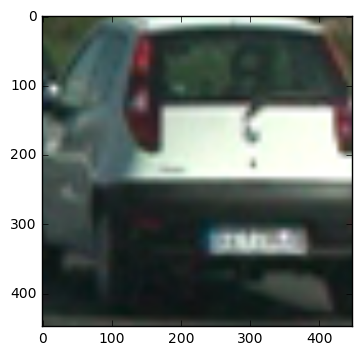

In [16]:
def more_data(images):
    print(images[0].shape)
    all_images = []
    for image in images:
        int_rand = np.random.randint(4,24)
#         print(int_rand)
        all_images.append(cv2.resize(image[int_rand:,int_rand:], size))
        
    
    print(all_images[0].shape)
    return np.concatenate((all_images,images),axis=0)
# more_data([img_car])
car_image = cv2.resize(img_car, size)
plt.imshow(more_data([car_image])[0])

In [17]:
def cnn_train(car_images, notcar_images): 
#     print(car_features[0].shape)
    car_features, notcar_features = equalise_sets(car_images, notcar_images)
#     car_features = more_data(car_features)
#     notcar_features = more_data(notcar_features)
    
    print("Set lengths after augmentation function:", len(car_features),len(notcar_features))
    
    X = np.vstack((notcar_features[:], car_features[:])).astype(np.float64) 
    # Define the labels vector
    print(X.shape)
    y = np.hstack((np.ones(len(car_features[:])), np.zeros(len(notcar_features[:]))))
    print(y.shape)
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=rand_state)

    # TODO: Normalize the data features to the variable X_normalized
    from sklearn.preprocessing import MinMaxScaler
    X_normalized = np.subtract(X_train/X_train.max(axis=0),0.5)

    X_test_normalized = X_test/X_test.max(axis=0) -0.5
    
    print("X_normalized: ", X_normalized.shape)
    with tf.Session() as sess:

        y_one_hot = sess.run(tf.one_hot(y_train, 2))
        y_test_one_hot = sess.run(tf.one_hot(y_test, 2))
    
    
#     X_normalized, y_one_hot = shuffle(X_normalized, y_one_hot)
    # TODO: Compile and train the model here.
    from keras.models import Sequential
    from keras.layers import Convolution2D, MaxPooling2D, AveragePooling2D
    from keras.layers.core import Dense, Activation, Flatten, Dropout
    
    model = Sequential()
    # TODO: Build a Multi-layer feedforward neural network with Keras here.
    #Set the first layer to a Flatten layer with the input_shape set to (32, 32, 3)
    model.add(Convolution2D(32, 3, 3, border_mode='same', input_shape=(448,448,3)))

    model.add(Activation('elu'))

    model.add(MaxPooling2D(pool_size = (4,4)))

    model.add(Convolution2D(32, 3, 3))
    
#     model.add(Dropout(0.80))

    model.add(Activation('elu'))

    model.add(MaxPooling2D(pool_size = (2,2)))

    model.add(Convolution2D(16, 3, 3))

    model.add(Activation('elu'))

#     model.add(MaxPooling2D(pool_size = (2,2)))

#     model.add(Convolution2D(8, 2, 2))

#     model.add(Activation('relu'))
    
#     model.add(Dropout(0.80))

#     model.add(Activation('elu'))

#     model.add(Dropout(0.80))

#     model.add(Activation('elu'))

    model.add(Flatten())

#     model.add(Dense(128))

#     model.add(Activation('elu'))

    model.add(Dense(2))

    model.add(Activation('softmax'))

    # Configures the learning process and metrics
    model.compile('adam', 'categorical_crossentropy', ['accuracy'])

    # Train the model
    # History is a record of training loss and metrics
    history = model.fit(X_train, y_one_hot, batch_size=32, nb_epoch=10, validation_split=0.2)

    # Calculate test score
    test_score = model.evaluate(X_test, y_test_one_hot)
    print("test score:", test_score)
    print('Test score:', test_score[0])
    print('Test accuracy:', test_score[1])

#     n_predict = 10
#     print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
#     print('For these',n_predict, 'labels: ', y_test[0:n_predict])
    
    return model

# print(svc.dtype)
cnn = cnn_train(car_images,notcar_images)

Set lengths before: 50 50
Set lengths after equalise function: 50 50
Set lengths after augmentation function: 50 50
(100, 448, 448, 3)
(100,)
X_normalized:  (80, 448, 448, 3)


Using TensorFlow backend.


Train on 64 samples, validate on 16 samples
Epoch 1/10


ResourceExhaustedError: OOM when allocating tensor with shape[32,32,112,112]
	 [[Node: gradients/MaxPool_grad/MaxPoolGrad = MaxPoolGrad[T=DT_FLOAT, _class=["loc:@MaxPool"], data_format="NHWC", ksize=[1, 4, 4, 1], padding="VALID", strides=[1, 4, 4, 1], _device="/job:localhost/replica:0/task:0/gpu:0"](Elu, MaxPool, gradients/Conv2D_1_grad/Conv2DBackpropInput)]]

Caused by op 'gradients/MaxPool_grad/MaxPoolGrad', defined at:
  File "/home/da7th/anaconda3/lib/python3.5/runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/da7th/anaconda3/lib/python3.5/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py", line 3, in <module>
    app.launch_new_instance()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/traitlets/config/application.py", line 653, in launch_instance
    app.start()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/kernelapp.py", line 474, in start
    ioloop.IOLoop.instance().start()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/zmq/eventloop/ioloop.py", line 162, in start
    super(ZMQIOLoop, self).start()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/tornado/ioloop.py", line 887, in start
    handler_func(fd_obj, events)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 440, in _handle_events
    self._handle_recv()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 472, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/zmq/eventloop/zmqstream.py", line 414, in _run_callback
    callback(*args, **kwargs)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/tornado/stack_context.py", line 275, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 276, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 228, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/kernelbase.py", line 390, in execute_request
    user_expressions, allow_stdin)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/ipkernel.py", line 196, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/ipykernel/zmqshell.py", line 501, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2717, in run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2821, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/IPython/core/interactiveshell.py", line 2881, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-17-a3a254f8c6c2>", line 103, in <module>
    cnn = cnn_train(car_images,notcar_images)
  File "<ipython-input-17-a3a254f8c6c2>", line 88, in cnn_train
    history = model.fit(X_train, y_one_hot, batch_size=32, nb_epoch=10, validation_split=0.2)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/models.py", line 627, in fit
    sample_weight=sample_weight)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/engine/training.py", line 1097, in fit
    self._make_train_function()
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/engine/training.py", line 714, in _make_train_function
    self.total_loss)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/optimizers.py", line 382, in get_updates
    grads = self.get_gradients(loss, params)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/optimizers.py", line 68, in get_gradients
    grads = K.gradients(loss, params)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/backend/tensorflow_backend.py", line 1065, in gradients
    return tf.gradients(loss, variables, colocate_gradients_with_ops=True)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/ops/gradients_impl.py", line 482, in gradients
    in_grads = grad_fn(op, *out_grads)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_grad.py", line 404, in _MaxPoolGrad
    data_format=op.get_attr("data_format"))
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 1697, in _max_pool_grad
    data_format=data_format, name=name)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/framework/op_def_library.py", line 759, in apply_op
    op_def=op_def)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 2240, in create_op
    original_op=self._default_original_op, op_def=op_def)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/framework/ops.py", line 1128, in __init__
    self._traceback = _extract_stack()

...which was originally created as op 'MaxPool', defined at:
  File "/home/da7th/anaconda3/lib/python3.5/runpy.py", line 184, in _run_module_as_main
    "__main__", mod_spec)
[elided 19 identical lines from previous traceback]
  File "<ipython-input-17-a3a254f8c6c2>", line 103, in <module>
    cnn = cnn_train(car_images,notcar_images)
  File "<ipython-input-17-a3a254f8c6c2>", line 45, in cnn_train
    model.add(MaxPooling2D(pool_size = (4,4)))
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/models.py", line 312, in add
    output_tensor = layer(self.outputs[0])
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py", line 514, in __call__
    self.add_inbound_node(inbound_layers, node_indices, tensor_indices)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py", line 572, in add_inbound_node
    Node.create_node(self, inbound_layers, node_indices, tensor_indices)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/engine/topology.py", line 149, in create_node
    output_tensors = to_list(outbound_layer.call(input_tensors[0], mask=input_masks[0]))
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/layers/pooling.py", line 162, in call
    dim_ordering=self.dim_ordering)
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/layers/pooling.py", line 212, in _pooling_function
    border_mode, dim_ordering, pool_mode='max')
  File "/home/da7th/anaconda3/lib/python3.5/site-packages/keras/backend/tensorflow_backend.py", line 1761, in pool2d
    x = tf.nn.max_pool(x, pool_size, strides, padding=padding)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/ops/nn_ops.py", line 1617, in max_pool
    name=name)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 1598, in _max_pool
    data_format=data_format, name=name)
  File "/home/da7th/.local/lib/python3.5/site-packages/tensorflow/python/framework/op_def_library.py", line 759, in apply_op
    op_def=op_def)

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[32,32,112,112]
	 [[Node: gradients/MaxPool_grad/MaxPoolGrad = MaxPoolGrad[T=DT_FLOAT, _class=["loc:@MaxPool"], data_format="NHWC", ksize=[1, 4, 4, 1], padding="VALID", strides=[1, 4, 4, 1], _device="/job:localhost/replica:0/task:0/gpu:0"](Elu, MaxPool, gradients/Conv2D_1_grad/Conv2DBackpropInput)]]


In [13]:
def cnn_train(car_images, notcar_images): 
#     print(car_features[0].shape)
    car_features, notcar_features = equalise_sets(car_images, notcar_images)
#     car_features = more_data(car_features)
#     notcar_features = more_data(notcar_features)
    
    print("Set lengths after augmentation function:", len(car_features),len(notcar_features))
    
    X = np.vstack((notcar_features[:], car_features[:])).astype(np.float64) 
    # Define the labels vector
    print(X.shape)
    y = np.hstack((np.ones(len(car_features[:])), np.zeros(len(notcar_features[:]))))
    print(y.shape)
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=rand_state)

    # TODO: Normalize the data features to the variable X_normalized
    from sklearn.preprocessing import MinMaxScaler
    X_normalized = np.subtract(X_train/X_train.max(axis=0),0.5)

    X_test_normalized = X_test/X_test.max(axis=0) -0.5
    
    print("X_normalized: ", X_normalized.shape)
    with tf.Session() as sess:

        y_one_hot = sess.run(tf.one_hot(y_train, 2))
        y_test_one_hot = sess.run(tf.one_hot(y_test, 2))
    
    
    from keras.models import Sequential
    from keras.layers import Convolution2D, MaxPooling2D, AveragePooling2D
    from keras.layers.core import Dense, Activation, Flatten, Dropout
    from keras.layers.advanced_activations import LeakyReLU
    
    model = Sequential()
    
    model.add(Convolution2D(16, 3, 3, border_mode='same', input_shape=(32,32,3)))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    

    model.add(Convolution2D(32, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Convolution2D(64, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Convolution2D(128, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Convolution2D(256, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Convolution2D(512, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Convolution2D(1024, 3, 3))

    model.add(LeakyReLU(alpha=0.3))

    model.add(MaxPooling2D(pool_size = (2,2)))
    
    

    model.add(Flatten())

    model.add(Dense(1470))

    model.add(Activation('linear'))

    model.add(Dense(2))

    model.add(Activation('softmax'))

    # Configures the learning process and metrics
    model.compile('adam', 'categorical_crossentropy', ['accuracy'])

    # Train the model
    # History is a record of training loss and metrics
    history = model.fit(X_train, y_one_hot, batch_size=32, nb_epoch=10, validation_split=0.2)

    # Calculate test score
    test_score = model.evaluate(X_test, y_test_one_hot)
    print("test score:", test_score)
    print('Test score:', test_score[0])
    print('Test accuracy:', test_score[1])

#     n_predict = 10
#     print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
#     print('For these',n_predict, 'labels: ', y_test[0:n_predict])
    
    return model

# print(svc.dtype)
cnn = cnn_train(car_images,notcar_images)

Set lengths before: 9070 8968
Set lengths after equalise function: 8968 8968
(32, 32, 3)
(32, 32, 3)
(32, 32, 3)
(32, 32, 3)
Set lengths after augmentation function: 17936 17936
(35872, 32, 32, 3)
(35872,)
X_normalized:  (28697, 32, 32, 3)


ValueError: Negative dimension size caused by subtracting 3 from 2 for 'Conv2D_12' (op: 'Conv2D') with input shapes: [?,2,2,64], [3,3,64,128].

In [95]:
def one_zero(pred):
    if pred[0][0] > pred[0][1]:
        pred = [1,0]
    else:
        pred = [0,1]
    return pred
X = np.expand_dims(car_images[9], axis=0)
print(one_zero(cnn.predict(X)))

X = np.expand_dims(notcar_images[351], axis=0)
print(one_zero(cnn.predict(X)))

[1, 0]
[0, 1]


(720, 1280, 3)
windows_n: 290


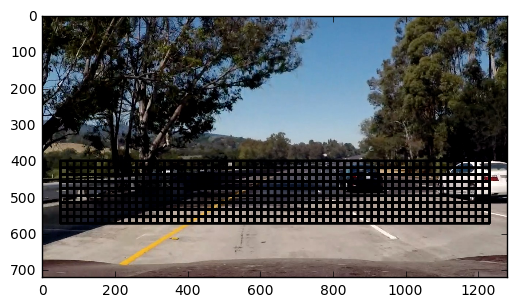

In [104]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[390, 650], 
                    xy_window=(128, 128), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
        
    xy_divisions = 2
    
    window_list = []    
    for i in range(1,xy_divisions):
        x_w = int(xy_window[0]*i*2)
        y_w = int(xy_window[1]*i*2)
        # Compute the span of the region to be searched    
        xspan = x_start_stop[1] - x_start_stop[0]
        yspan = y_start_stop[1] - y_start_stop[0]
        # Compute the number of pixels per step in x/y
        nx_pix_per_step = np.int(x_w*(1 - xy_overlap[0]))
        ny_pix_per_step = np.int(y_w*(1 - xy_overlap[1]))
        # Compute the number of windows in x/y
        nx_buffer = np.int(x_w*(xy_overlap[0]))
        ny_buffer = np.int(y_w*(xy_overlap[1]))
        nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
        ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
        # Initialize a list to append window positions to
        # Loop through finding x and y window positions
        # Note: you could vectorize this step, but in practice
        # you'll be considering windows one by one with your
        # classifier, so looping makes sense
        for ys in range(5):
            for xs in range(nx_windows):
                # Calculate window position
                startx = xs*nx_pix_per_step + x_start_stop[0]
                endx = startx + x_w
                starty = ys*ny_pix_per_step + y_start_stop[0]
                endy = starty + y_w
                
                if endy <= img.shape[0] and img.shape[1]:
                    # Append window position to list
                    window_list.append(((startx, starty), (endx, endy)))
        y_start_stop[0] = y_start_stop[0] + xy_window[0]
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

print(image.shape)
windows = slide_window(image, x_start_stop=[50, image.shape[1]-50], y_start_stop=[400, 650], 
                    xy_window=(48, 48), xy_overlap=(0.8, 0.8))
print("windows_n:",len(windows))

box_img = draw_boxes(image, windows)
plt.imshow(box_img)

290


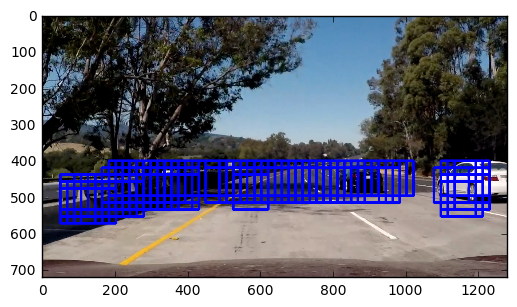

In [112]:
print(len(windows))
def preprocess(X_normalized):
#     print(img.shape)
#     X = np.expand_dims(X, axis=0)
#     print(X.shape)
#     print(X_normalized.shape)

#     X_normalized = cv2.cvtColor(X_normalized, cv2.COLOR_RGB2YCrCb)
    X_normalized = np.expand_dims(X_normalized, axis=0)
    
#     X_normalized = X_normalized/X_normalized.max(axis=0) -0.5
#     X_normalized = np.uint8(X_normalized)
#     edges1 = cv2.Canny(X_normalized[:,:,0],100,200)
#     edges2 = cv2.Canny(X_normalized[:,:,1],100,200)
#     edges3 = cv2.Canny(X_normalized[:,:,2],100,200)

#     X_normalized = np.stack((edges1,edges2,edges3),axis=2)
    
#     X_normalized = np.expand_dims(X_normalized, axis=0)
    
    return X_normalized


# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf=cnn):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    counter = 0
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (32, 32))   
#         mpimg.imsave(("image" + str(counter) + ".png"), test_img)
        counter+=1
        test_img = preprocess(test_img)
#         print(test_img.shape)

        prediction = clf.predict(test_img)
        #7) If positive (prediction == 1) then save the window
#         print("prediction:", prediction)
        
        if prediction[0][0] > 0.5:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows


#sample image parameters
y_start_stop = [350, 650] # Min and max in y to search in slide_window()
image = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P5/test_images/test5.jpg')
draw_image = np.copy(image)
image = image.astype(np.float32)/255

hot_windows = search_windows(image, windows, clf=cnn)      

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.imshow(window_img)

In [113]:
def overlay_check(w_list, new_w):
    result = True
    for curr_w in w_list:
        
        if ((new_w[0] < curr_w[2] and new_w[0] > curr_w[0]) or (new_w[2] < curr_w[2] and new_w[0] > curr_w[0])) and\
        ((new_w[1] < curr_w[3] and new_w[1] > curr_w[1]) or (new_w[3] < curr_w[3] and new_w[1] > curr_w[1])):
            result = False
    
    return result

In [114]:
# Function to add "heat" but adding 1 to the concerned area
def add_heat(heatmap, bbox_list=hot_windows):
    # Iterate through list of bboxes
    
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap# Iterate through list of bboxes

In [115]:
# Function that applies a threshold to the heatmap but removing values below a given threshold value
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

In [116]:
# Draw the positive labeled boxes for the final output image to be processed
def draw_labeled_bboxes(img, labels):
    w_listing = []
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        print()
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        
        #original window parameters
        x1 = np.min(nonzerox)
        x2 = np.max(nonzerox)
        y1 = np.min(nonzeroy)
        y2 = np.max(nonzeroy)
        
        # draw original rectangle detected
        cv2.rectangle(img, (x1,y1), (x2,y2), (100,100,200), 6)
        
        
        x1l = np.min(nonzerox)
        x2l = np.int((x1+x2)/2)
        y1l = np.int((y1+y2)/2)
        y2l = np.max(nonzeroy)
        cv2.line(img, (x1l,y1l), (x2l,y2l), (100,200,200), 6)
        
    return img

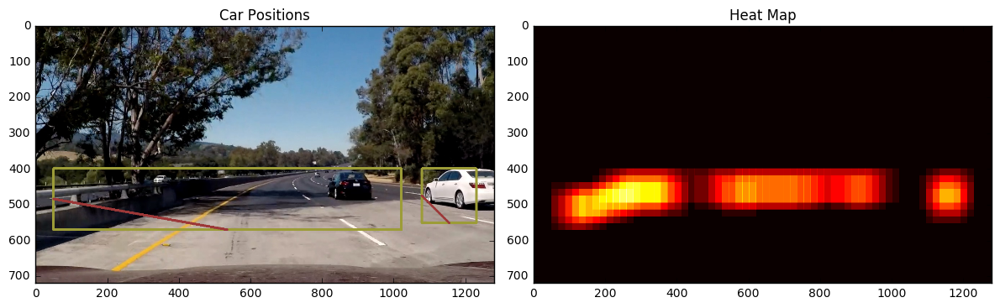

In [117]:
heat = np.zeros_like(image[:,:,0]).astype(np.float)
# Add heat to each box in box list
heat = add_heat(heat,hot_windows)
    
# Apply threshold to help remove false positives
# The threshold value used is just for visualisation and should be changed to an optimal value
heat = apply_threshold(heat,0)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure(figsize=(12,4))
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()

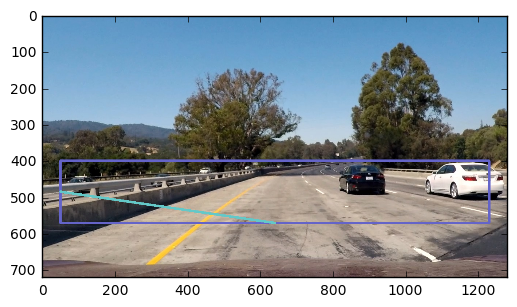

In [111]:
###### PIPELINE

# for averaging purposes
hot_wind_collection = []
last_labels = []
# A pipeline function to automate the prediction process for continuous (video) inputs.
def pipeline(img):
    
    global hot_wind_collection
    global last_labels
    
    draw_image = np.copy(img)
    image = img.astype(np.float32)/255

    hot_windows = search_windows(image, windows, clf=cnn)      
#     window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)  
    
    if hot_windows != []:
        hot_wind_collection.append(hot_windows)
    
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    
    
    threshold_val = 3
    
    
    if len(hot_wind_collection) > 5:
        # Add heat to each box in box list
        heat = add_heat(heat,hot_wind_collection[-1])
        heat = apply_threshold(heat,threshold_val)
        heat = add_heat(heat,hot_wind_collection[-2])
        heat = apply_threshold(heat,threshold_val)
        heat = add_heat(heat,hot_wind_collection[-3])
        heat = apply_threshold(heat,threshold_val)
        heat = add_heat(heat,hot_wind_collection[-4])
        heat = apply_threshold(heat,threshold_val)
        heat = add_heat(heat,hot_wind_collection[-5])
        heat = apply_threshold(heat,threshold_val)
        heat = add_heat(heat,hot_wind_collection[-6])
        heat = apply_threshold(heat,threshold_val)
        
        # Apply threshold to help remove false positives
#         heat = apply_threshold(heat,6)
    else:
        # Add heat to each box in box list
        heat = add_heat(heat,hot_windows)

        # Apply threshold to help remove false positives
        heat = apply_threshold(heat,threshold_val)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    if len(labels) < 2:
        labels = last_labels
        
    last_labels = labels
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
#     plt.imshow(window_img)

    return draw_img


image = mpimg.imread('/home/da7th/Desktop/Udacity/sdc/CarND-P5/test_images/test1.jpg')
# print(image.dtype)
plt.imshow(pipeline(image))

In [ ]:
heat_maps = []
white_output = '/home/da7th/Desktop/Udacity/sdc/CarND-P5/black.mp4'
# clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4").subclip(30,40)
clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4")
# reset_lines()
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

# Combining detection results

In [ ]:
def combined_pipeline(img):
    
    v_detection_img = pipeline(img)
    lane_img = process_img(v_detection_img)
    
#     comb_final_img = weighted_img(v_detection_img, lane_img)
    return lane_img
plt.imshow(combined_pipeline(img))

In [ ]:
heat_maps = []
white_output = '/home/da7th/Desktop/Udacity/sdc/testing/white.mp4'
# clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4").subclip(26,33)
clip1 = VideoFileClip("/home/da7th/Desktop/Udacity/sdc/CarND-P5/project_video.mp4")
# reset_lines()
white_clip = clip1.fl_image(combined_pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)